# assume we have both acc and gyro
# set the data to world coordination using imufusion

1. get data from both back and chest
2. plot an example of acceleration and euler (gyroscope) segment
3. use cnngru network to get latent representations of accelerations from both back and chest data
4. plot latent representation of accel
5. use cnngru network to get latent representations of fine-tuned accel
6. plot the new latent representation of accel 
https://github.com/xioTechnologies/Gait-Tracking

In [22]:
# import numpy as np
# import os
# import matplotlib.pyplot as plt
# import pickle
# import pandas as pd
# from torch.utils.data import Dataset, DataLoader
# import torch
# import torch.nn as nn
# 
# from scipy.interpolate import interp1d
# import math
# from datetime import datetime
# from tqdm import tqdm
# from sklearn.manifold import TSNE
import imufusion
# import pickle

import numpy as np
import os
import matplotlib.pyplot as plt
import pickle
import pandas as pd
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn

from scipy.interpolate import interp1d
import math
from datetime import datetime
from tqdm import tqdm
from sklearn.manifold import TSNE
from umap import UMAP
from deepview.clustering_pytorch.datasets.factory import sliding_window

import plotly.express as px


In [2]:
os.getcwd()

'D:\\code\\DeepView\\deepview'

In [3]:
with open(os.path.join(os.getcwd(), 'calculate_results', 'data_b1.pkl'), 'rb') as f:
    df_ready1 = pickle.load(f)
with open(os.path.join(os.getcwd(), 'calculate_results', 'data_b0.pkl'), 'rb') as f:
    df_ready0 = pickle.load(f)
    

In [86]:
with open (os.path.join(os.getcwd(), 'calculate_results','world_coord_umineko2018_b0.pkl'), 'wb') as f:
    pickle.dump({
        'accel': acceleration0,
        'gyro': gyroscope0,
        'euler': euler0
    }, f)
with open (os.path.join(os.getcwd(), 'calculate_results','world_coord_umineko2018_b1.pkl'), 'wb') as f:
    pickle.dump({
        'accel': acceleration1,
        'gyro': gyroscope1,
        'euler': euler1
    }, f)

## world coordination and eurl angle 

In [4]:
sample_rate = 25
# Instantiate AHRS algorithms
offset = imufusion.Offset(sample_rate)
ahrs = imufusion.Ahrs()

ahrs.settings = imufusion.Settings(imufusion.CONVENTION_NWU,
                                   0.5,  # gain
                                   2000,  # gyroscope range
                                   10,  # acceleration rejection
                                   0,  # magnetic rejection
                                   5 * sample_rate)  # rejection timeout = 5 seconds



In [5]:
timestamp1 = df_ready1.timestamp.values
accelerometer1 = df_ready1[['acc_x', 'acc_y', 'acc_z']].values
gyroscope1 = df_ready1[['gyro_x', 'gyro_y', 'gyro_z']].values


In [6]:
# Convert the timestamp strings to datetime objects
datetime_objects = [
    datetime.strptime(ts, '%Y-%m-%dT%H:%M:%S.%fZ') for ts in timestamp1
]

# Calculate the delta time in seconds between consecutive timestamps
delta_time1 = [
    (datetime_objects[i+1] - datetime_objects[i]).total_seconds()
    for i in range(len(datetime_objects) - 1)
]
delta_time1.insert(0, 0)

In [7]:

euler1 = np.empty((len(timestamp1), 3))
internal_states1 = np.empty((len(timestamp1), 3))
acceleration1 = np.empty((len(timestamp1), 3))

for index in range(len(timestamp1)):
    gyroscope1[index] = offset.update(gyroscope1[index])

    ahrs.update_no_magnetometer(gyroscope1[index], accelerometer1[index], delta_time1[index])

    euler1[index] = ahrs.quaternion.to_euler()

    ahrs_internal_states = ahrs.internal_states
    internal_states1[index] = np.array([ahrs_internal_states.acceleration_error,
                                          ahrs_internal_states.accelerometer_ignored,
                                          ahrs_internal_states.acceleration_recovery_trigger])
    # 新acceleration data
    acceleration1[index] = 9.81 * ahrs.earth_acceleration  # convert g to m/s/s

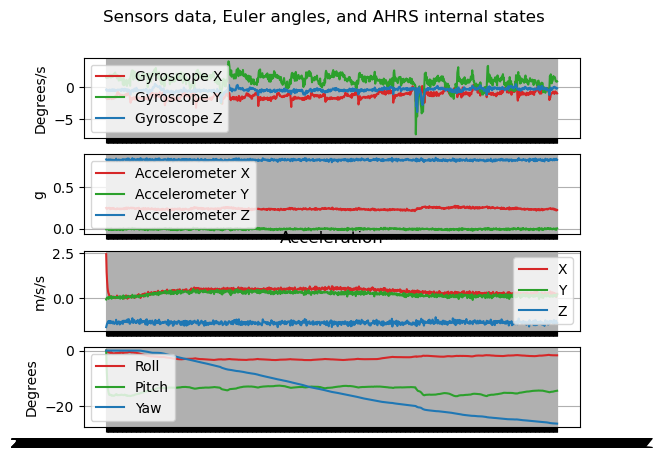

In [8]:
length = 1000

# Plot sensor data
figure, axes = plt.subplots(nrows=4, sharex=True, gridspec_kw={"height_ratios": [6, 6, 6, 6]})

figure.suptitle("Sensors data, Euler angles, and AHRS internal states")

axes[0].plot(timestamp1[:length], gyroscope1[:length, 0], "tab:red", label="Gyroscope X")
axes[0].plot(timestamp1[:length], gyroscope1[:length, 1], "tab:green", label="Gyroscope Y")
axes[0].plot(timestamp1[:length], gyroscope1[:length, 2], "tab:blue", label="Gyroscope Z")
axes[0].set_ylabel("Degrees/s")
axes[0].grid()
axes[0].legend()

axes[1].plot(timestamp1[:length], accelerometer1[:length, 0], "tab:red", label="Accelerometer X")
axes[1].plot(timestamp1[:length], accelerometer1[:length, 1], "tab:green", label="Accelerometer Y")
axes[1].plot(timestamp1[:length], accelerometer1[:length, 2], "tab:blue", label="Accelerometer Z")
axes[1].set_ylabel("g")
axes[1].grid()
axes[1].legend()

# Plot acceleration
axes[2].plot(timestamp1[:length], acceleration1[:length, 0], "tab:red", label="X")
axes[2].plot(timestamp1[:length], acceleration1[:length, 1], "tab:green", label="Y")
axes[2].plot(timestamp1[:length], acceleration1[:length, 2], "tab:blue", label="Z")
axes[2].set_title("Acceleration")
axes[2].set_ylabel("m/s/s")
axes[2].grid()
axes[2].legend()

# Plot Euler angles
axes[3].plot(timestamp1[:length], euler1[:length, 0], "tab:red", label="Roll")
axes[3].plot(timestamp1[:length], euler1[:length, 1], "tab:green", label="Pitch")
axes[3].plot(timestamp1[:length], euler1[:length, 2], "tab:blue", label="Yaw")
axes[3].set_ylabel("Degrees")
axes[3].grid()
axes[3].legend()


In [9]:
timestamp0 = df_ready0.timestamp.values
accelerometer0 = df_ready0[['acc_x', 'acc_y', 'acc_z']].values
gyroscope0 = df_ready0[['gyro_x', 'gyro_y', 'gyro_z']].values

# Convert the timestamp strings to datetime objects
datetime_objects = [
    datetime.strptime(ts, '%Y-%m-%dT%H:%M:%S.%fZ') for ts in timestamp0
]

# Calculate the delta time in seconds between consecutive timestamps
delta_time0 = [
    (datetime_objects[i+1] - datetime_objects[i]).total_seconds()
    for i in range(len(datetime_objects) - 1)
]
delta_time0.insert(0, 0)

In [10]:

euler0 = np.empty((len(timestamp0), 3))
internal_states0 = np.empty((len(timestamp0), 3))
acceleration0 = np.empty((len(timestamp0), 3))

for index in range(len(timestamp0)):
    gyroscope0[index] = offset.update(gyroscope0[index])

    ahrs.update_no_magnetometer(gyroscope0[index], accelerometer0[index], delta_time0[index])

    euler0[index] = ahrs.quaternion.to_euler()

    ahrs_internal_states = ahrs.internal_states
    internal_states0[index] = np.array([ahrs_internal_states.acceleration_error,
                                          ahrs_internal_states.accelerometer_ignored,
                                          ahrs_internal_states.acceleration_recovery_trigger])
    # 新acceleration data
    acceleration0[index] = 9.81 * ahrs.earth_acceleration  # convert g to m/s/s

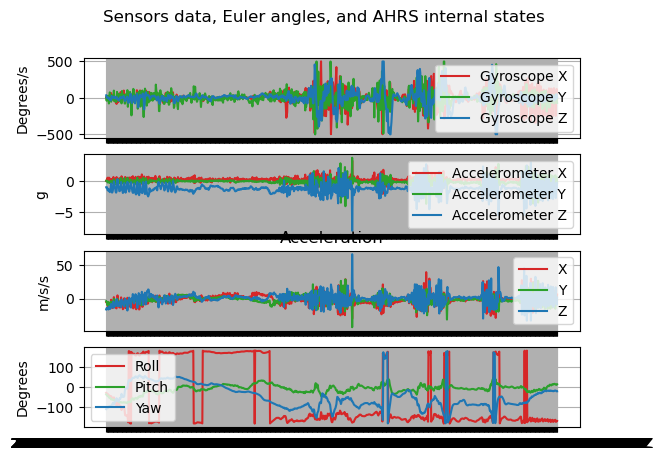

In [11]:

# Plot sensor data
figure, axes = plt.subplots(nrows=4, sharex=True, gridspec_kw={"height_ratios": [6, 6, 6, 6]})

figure.suptitle("Sensors data, Euler angles, and AHRS internal states")

axes[0].plot(timestamp0[:length], gyroscope0[:length, 0], "tab:red", label="Gyroscope X")
axes[0].plot(timestamp0[:length], gyroscope0[:length, 1], "tab:green", label="Gyroscope Y")
axes[0].plot(timestamp0[:length], gyroscope0[:length, 2], "tab:blue", label="Gyroscope Z")
axes[0].set_ylabel("Degrees/s")
axes[0].grid()
axes[0].legend()

axes[1].plot(timestamp0[:length], accelerometer0[:length, 0], "tab:red", label="Accelerometer X")
axes[1].plot(timestamp0[:length], accelerometer0[:length, 1], "tab:green", label="Accelerometer Y")
axes[1].plot(timestamp0[:length], accelerometer0[:length, 2], "tab:blue", label="Accelerometer Z")
axes[1].set_ylabel("g")
axes[1].grid()
axes[1].legend()

# Plot acceleration
axes[2].plot(timestamp0[:length], acceleration0[:length, 0], "tab:red", label="X")
axes[2].plot(timestamp0[:length], acceleration0[:length, 1], "tab:green", label="Y")
axes[2].plot(timestamp0[:length], acceleration0[:length, 2], "tab:blue", label="Z")
axes[2].set_title("Acceleration")
axes[2].set_ylabel("m/s/s")
axes[2].grid()
axes[2].legend()

# Plot Euler angles
axes[3].plot(timestamp0[:length], euler0[:length, 0], "tab:red", label="Roll")
axes[3].plot(timestamp0[:length], euler0[:length, 1], "tab:green", label="Pitch")
axes[3].plot(timestamp0[:length], euler0[:length, 2], "tab:blue", label="Yaw")
axes[3].set_ylabel("Degrees")
axes[3].grid()
axes[3].legend()


# create data loaders

In [15]:
label_dict = {
  'ground_stationary': 0,
  'stationary': 0,
  'preening': 0,
  'bathing': 1,
    'bathing_poss': 1,
    'body_shaking': 6,
    'flying_active': 7,
    'flying_passive': 7,
    'foraging': 4,
    'foraging_fish_poss': 4,
    'foraging_insect_poss': 4,
    'foraging_non-fish': 4,
    'foraging_poss': 4,
    'ground_active': 8,
  'flight_take_off': 2,
  'flight_cruising': 3,
  'foraging_dive': 4,
  'surface_seizing': 5,
  'unknown': -1,
  }

In [16]:
class data_loader_umineko(Dataset):
    def __init__(self, samples, labels, device='cpu'):
        self.samples = torch.tensor(samples).to(device)  # check data type
        self.labels = torch.tensor(labels)  # check data type

    def __getitem__(self, index):
        target = self.labels[index]
        sample = self.samples[index]
        return sample, target

    def __len__(self):
        return len(self.labels)

In [17]:
class MSEloss(nn.Module):
    def __init__(self):
        super(MSEloss, self).__init__()

    def forward(self, input, target):
        '''
        input: raw sensor data
        target: reconstructed sensor data
        the mse loss makes the target data to be similar to the input data
        '''
        loss = nn.MSELoss()
        output = loss(input, target)
        return output

In [18]:
# Function to calculate mode for each row
def majority_value(arr):
    majority = []
    for row in arr:  
        values, counts = np.unique(row, return_counts=True)
        majority.append(values[np.argmax(counts)])
    return np.array(majority)

In [19]:
def AE_eval_time_series(train_loader, model, device):
    model.eval()

    representation_list = []
    sample_list, timestamp_list, label_list, pred_list, timestr_list, flag_list = [], [], [], [], [], []
    for i, (sample, label) in enumerate(train_loader):
        sample = sample.to(device=device, non_blocking=True, dtype=torch.float)

        # input of autoencoder will be 3D, the backbone is 1d-cnn
        x_encoded, output = model(sample)  # x_encoded.shape=batch512,outchannel128,len13
        # print(type(output))
        # x_encoded, output = model(input_).view(b, 2, -1)  # output.shape=b,2,128, split the first dim into 2 parts
        tmp_representation = x_encoded.detach().cpu().numpy()
        representation_list.append(tmp_representation)
        sample_list.append(sample.detach().cpu().numpy())
        label_list.append(label.detach().cpu().numpy())
        pred_list.append(output.detach().cpu().numpy())

    return representation_list, sample_list, pred_list, label_list

In [23]:
sensor_type = 'accel'
batch_size = 512
device = 'cuda'
len_sw = 180
out_channels = 32

selected_columns = ['acc_x', 'acc_y', 'acc_z',
                   'label_id']  # without timestamps
tmp_b = sliding_window(df_ready0[selected_columns], len_sw)

# concatenate list
data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
label_b = tmp_b[:,:,-1]  # [B, Len]

train_set_r = data_loader_umineko(data_b, label_b, device=device)
train_loader0 = DataLoader(train_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)

# 每一个文件为一个test loader
test_filenames = df_ready0.animal_tag.unique()
test_loaders0 = []
for f in test_filenames:
    single_df = df_ready0[df_ready0['animal_tag']==f]
    tmp_b = sliding_window(single_df[selected_columns], len_sw)
    # concatenate list
    data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
    label_b = tmp_b[:,:,-1]  # [B, Len]
    test_set_r = data_loader_umineko(data_b, label_b, device=device)
    test_loader = DataLoader(test_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)
    test_loaders0.append(test_loader)

In [24]:
tmp_b = sliding_window(df_ready1[selected_columns], len_sw)

# concatenate list
data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
label_b = tmp_b[:,:,-1]  # [B, Len]

train_set_r = data_loader_umineko(data_b, label_b, device=device)
train_loader1 = DataLoader(train_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)

# 每一个文件为一个test loader
test_filenames = df_ready1.animal_tag.unique()
test_loaders1 = []
for f in test_filenames:
    single_df = df_ready1[df_ready1['animal_tag']==f]
    tmp_b = sliding_window(single_df[selected_columns], len_sw)
    # concatenate list
    data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
    label_b = tmp_b[:,:,-1]  # [B, Len]
    test_set_r = data_loader_umineko(data_b, label_b, device=device)
    test_loader = DataLoader(test_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)
    test_loaders1.append(test_loader)

In [25]:
from deepview.calculate_results.ae_model2 import CNN_AE

model = CNN_AE(3, out_channels)
model = model.to(device)

full_model_path = r'D:\code\DeepView\deepview\calculate_results\cnngru_epoch39999_datalen180_accel.pth'

if torch.cuda.is_available():
    model.load_state_dict(torch.load(full_model_path, weights_only=False))
else:
    model.load_state_dict(torch.load(full_model_path, weights_only=False, map_location=torch.device('cpu')))
    

optimizer = torch.optim.Adam(model.parameters(),
                                     weight_decay=0.000001,
                                     lr=0.0001)
criterion = MSEloss()
criterion = criterion.to(device)

In [ ]:
## back=0

In [26]:
representation_list0, sample_list0, pred_list0, label_list0 = \
            AE_eval_time_series(train_loader0, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list0)
repre_reshape0 = repre_concat.reshape(repre_concat.shape[0], -1)

label_concat = np.concatenate(label_list0)
label_concat_vote0 = majority_value(label_concat)
label_concat_vote0.shape

(7694,)

In [27]:
# umap_2d = UMAP(n_components=2)
umap_3d = UMAP(n_components=3)

# proj_2d = umap_2d.fit_transform(repre_reshape)
proj_3d = umap_3d.fit_transform(repre_reshape0)

# fig_2d = px.scatter(
#     proj_2d, x=0, y=1,
#     color=label_concat_vote.astype(str),  
#     labels={'color': 'activity'}
# )

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=label_concat_vote0.astype(str),  
    labels={'color': 'activity'}
)
fig_3d.update_traces(marker_size=5)

# fig_2d.show()
fig_3d.show()

In [27]:
## back=1

In [28]:
representation_list1, sample_list1, pred_list1, label_list1 = \
            AE_eval_time_series(train_loader1, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list1)
repre_reshape1 = repre_concat.reshape(repre_concat.shape[0], -1)

label_concat = np.concatenate(label_list1)
label_concat_vote1 = majority_value(label_concat)
label_concat_vote1.shape

(4503,)

In [29]:

umap_3d = UMAP(n_components=3)

proj_3d = umap_3d.fit_transform(repre_reshape1)

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=label_concat_vote1.astype(str),  
    labels={'color': 'activity'}
)
fig_3d.update_traces(marker_size=5)

fig_3d.show()

In [30]:
## combine

In [32]:
df_ready = pd.concat([df_ready0, df_ready1], axis=0)
df_ready.head(1)

,timestamp,acc_x,acc_y,acc_z,GPS_velocity,GPS_bearing,gyro_x,gyro_y,gyro_z,mag_x,mag_y,mag_z,illumination,pressure,temperature,label_id,animal_tag
194706,2018-05-29T06:26:28.520Z,0.060059,0.070801,-0.95459,7.845765,285.663717,4.837036,6.17981,35.049438,-0.007102,0.2565,-0.749391,4984.0,16.349976,29.75,7.0,LB14


In [61]:
# Create a vector with 0s for df1 and 1s for df2
labels = np.array([0] * len(df_ready0) + [1] * len(df_ready1))
lb_b = sliding_window(labels.reshape(-1,1), len_sw)
label_concat_vote = majority_value(lb_b)

In [58]:
tmp_b = sliding_window(df_ready[selected_columns], len_sw)

# concatenate list
data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
label_b = tmp_b[:,:,-1]  # [B, Len]

train_set_r = data_loader_umineko(data_b, label_b, device=device)
train_loader = DataLoader(train_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)

# 每一个文件为一个test loader
test_filenames = df_ready.animal_tag.unique()
test_loaders = []
for f in test_filenames:
    single_df = df_ready[df_ready['animal_tag']==f]
    tmp_b = sliding_window(single_df[selected_columns], len_sw)
    # concatenate list
    data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
    label_b = tmp_b[:,:,-1]  # [B, Len]
    test_set_r = data_loader_umineko(data_b, label_b, device=device)
    test_loader = DataLoader(test_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)
    test_loaders.append(test_loader)

In [59]:
representation_list, sample_list, pred_list, label_list = \
            AE_eval_time_series(train_loader, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list)
repre_reshape = repre_concat.reshape(repre_concat.shape[0], -1)


(12199,)

In [62]:

umap_3d = UMAP(n_components=3)

proj_3d = umap_3d.fit_transform(repre_reshape)

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=label_concat_vote.astype(str),  
    labels={'color': 'backID'}
)
fig_3d.update_traces(marker_size=5)

fig_3d.show()

In [63]:
### after converted to world coordination, visualize results

In [72]:
world_np = np.concatenate([acceleration0, acceleration1], axis=0)
world_np = np.concatenate([world_np, labels.reshape(-1,1)], axis=1)
world_np.shape
world_pd = pd.DataFrame(world_np)

tmp_b = sliding_window(world_pd, len_sw)

# concatenate list
data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
label_b = tmp_b[:,:,-1]  # [B, Len]

train_set_r = data_loader_umineko(data_b, label_b, device=device)
train_loader_wd = DataLoader(train_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)


In [73]:
representation_list_wd, sample_list_wd, pred_list_wd, label_list_wd = \
            AE_eval_time_series(train_loader_wd, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list_wd)
repre_reshape_wd = repre_concat.reshape(repre_concat.shape[0], -1)


In [74]:

umap_3d = UMAP(n_components=3)

proj_3d = umap_3d.fit_transform(repre_reshape_wd)

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=label_concat_vote.astype(str),  
    labels={'color': 'backID'}
)
fig_3d.update_traces(marker_size=5)

fig_3d.show()

## latent space of world coordination

In [84]:
# back = 0

labels = df_ready0.label_id.values.reshape(-1,1)
lb_b = sliding_window(labels.reshape(-1,1), len_sw)
label_concat_vote = majority_value(lb_b)

world_np = np.concatenate([acceleration0, labels], axis=1)
world_np.shape
world_pd = pd.DataFrame(world_np)

tmp_b = sliding_window(world_pd, len_sw)

# concatenate list
data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
label_b = tmp_b[:,:,-1]  # [B, Len]

train_set_r = data_loader_umineko(data_b, label_b, device=device)
train_loader_wd = DataLoader(train_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)

representation_list_wd, sample_list_wd, pred_list_wd, label_list_wd = \
            AE_eval_time_series(train_loader_wd, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list_wd)
repre_reshape_wd = repre_concat.reshape(repre_concat.shape[0], -1)


umap_3d = UMAP(n_components=3)

proj_3d = umap_3d.fit_transform(repre_reshape_wd)

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=label_concat_vote.astype(str),  
    labels={'color': 'activity'}
)
fig_3d.update_traces(marker_size=5)

fig_3d.show()

In [83]:
# back = 1

labels = df_ready1.label_id.values.reshape(-1,1)
lb_b = sliding_window(labels.reshape(-1,1), len_sw)
label_concat_vote = majority_value(lb_b)

world_np = np.concatenate([acceleration1, labels], axis=1)
world_np.shape
world_pd = pd.DataFrame(world_np)

tmp_b = sliding_window(world_pd, len_sw)

# concatenate list
data_b = tmp_b[:,:,:-1]  # [B, Len, dim-1]
label_b = tmp_b[:,:,-1]  # [B, Len]

train_set_r = data_loader_umineko(data_b, label_b, device=device)
train_loader_wd = DataLoader(train_set_r, batch_size=batch_size,
                           shuffle=False, drop_last=False)

representation_list_wd, sample_list_wd, pred_list_wd, label_list_wd = \
            AE_eval_time_series(train_loader_wd, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list_wd)
repre_reshape_wd = repre_concat.reshape(repre_concat.shape[0], -1)


umap_3d = UMAP(n_components=3)

proj_3d = umap_3d.fit_transform(repre_reshape_wd)

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=label_concat_vote.astype(str),  
    labels={'color': 'activity'}
)
fig_3d.update_traces(marker_size=5)

fig_3d.show()